In [34]:
import os
import PyPDF2
import fitz
import pandas as pd
import collections
import re

In [35]:
from nltk import tokenize
# import nltk
# nltk.download('punkt')

In [36]:
dir = 'annoted_sustainability_reports/Industrials/'

In [37]:
x_label = ["Caterpillar", "Lockheed", "Boeing", "UPS", "Raytheon", "Delta", "Deere", "Honeywell", "3M", "UnionPacific"]

### Extracting Sentences: Refined Version

In [38]:
# this method will return a list of highlighted sentences in each page 
def get_page_highlights_coord(annot):
    page_highlights_coord = []
    while annot:
        if annot.type[0] == 8:
            all_coordinates = annot.vertices
            try:
                if len(all_coordinates) == 4:
                    highlight_coord = fitz.Quad(all_coordinates).rect
                    page_highlights_coord.append(highlight_coord)
                else:
                    all_coordinates = [all_coordinates[x:x+4] for x in range(0, len(all_coordinates), 4)]
                    for i in range(0,len(all_coordinates)):
                        coord = fitz.Quad(all_coordinates[i]).rect
                        page_highlights_coord.append(coord)
            except:
                print("NoneType found")
        annot = annot.next
    return page_highlights_coord
        

In [39]:
def get_page_highlights_text(page_highlights_coord, all_words, test_pos, repeat_coord):
    page_highlights = collections.defaultdict(list)
    for h in page_highlights_coord:
        test_dict = collections.defaultdict(list) # intialize a dictionary that keeps order and 
        # indication of where the sentence breaks occur
        for w in all_words:
            if (fitz.Rect(w[0:4]).intersects(h)): 
            # find intersections where the original report overlaps with the highlighted sentences
                new_pos = int(str("%02d" % w[5]) + str("%02d" % w[6]) + str("%02d" % w[7])) 
#                 print(new_pos, w[4])
                if new_pos not in repeat_coord:
                    repeat_coord.append(new_pos)
                    if test_pos <  new_pos:
#                         print('less than', test_pos, new_pos, w[4]) 
                        test_pos = new_pos 
                        test_dict[new_pos].append(w[4])
                        page_highlights[new_pos].append(test_dict[new_pos][0])
#                         page_highlights.append({new_pos : test_dict[new_pos]})
                    else:
#                         print('greater than', test_pos, new_pos, w[4])
                        test_dict = collections.defaultdict(list)
                        test_pos = 0
                        test_dict[new_pos].append(w[4])
                        page_highlights[new_pos].append(test_dict[new_pos][0])
#                         page_highlights.append({new_pos : test_dict[new_pos]})
                else:
                    continue
    return page_highlights
                    

In [40]:
def get_total_highlights_text(total_page_highlights):
    total_page_highlights_text = []
    for i in total_page_highlights:
        highlights = ""
        sorted_dict = sorted(i.items(), key = lambda kv:kv[0], reverse = False)
        for k in sorted_dict:
            highlights += k[1][0] + " "
            
        total_page_highlights_text.append(highlights)
    
    return total_page_highlights_text

In [41]:
def make_text(words):
    """Return textstring output of getText("words").

    Word items are sorted for reading sequence left to right,
    top to bottom.
    """
    line_dict = {}  # key: vertical coordinate, value: list of words
    words.sort(key=lambda w: w[0])  # sort by horizontal coordinate
    for w in words:  # fill the line dictionary
        y1 = round(w[3], 0)  # bottom of a word: don't be too picky!
        word = w[4]  # the text of the word
        line = line_dict.get(y1, [])  # read current line content
        line.append(word)  # append new word
        line_dict[y1] = line  # write back to dict
    lines = list(line_dict.items())
    lines.sort()  # sort vertically
    return "\n".join([" ".join(line[1]) for line in lines])

In [42]:
import pdftotext

In [43]:
# Get ALL SENTENCES using the pdftotext package:

all_result_refined = []
all_comp_refined = []

# running all the files in the industry folder
for file in os.listdir(dir): 

    # f = filename + directory
    f = os.path.join(dir, file) 
    print(f)
    
    comp_lab = list(filter(lambda x:  x in f, x_label))
    print(comp_lab)

    with open(f, "rb") as output:
        pdf = pdftotext.PDF(output)

        # Read all the text into one string
        pdftotext_text = " ".join(pdf)
        
    for sent in tokenize.sent_tokenize(pdftotext_text):
        for within_sent in sent.split('\n\n'):
            all_result_refined.append(within_sent)
            all_comp_refined.append(comp_lab[0])


annoted_sustainability_reports/Industrials/Caterpillar_sustainability_2021.pdf
['Caterpillar']
annoted_sustainability_reports/Industrials/Lockheed_Martin_2021_Sustainability_Report.pdf
['Lockheed']
annoted_sustainability_reports/Industrials/Boeing_2022_Sustainability_Report.pdf
['Boeing']
annoted_sustainability_reports/Industrials/UPS_2020_TCFD_report.pdf
['UPS']
annoted_sustainability_reports/Industrials/Raytheon_2021_ESG_Report.pdf
['Raytheon']
annoted_sustainability_reports/Industrials/Delta_2021-esg-report.pdf
['Delta']
annoted_sustainability_reports/Industrials/Deere_sustainability-report-2021.pdf
['Deere']
annoted_sustainability_reports/Industrials/Honeywell_Corporate-Citizenship-Report.pdf
['Honeywell']
annoted_sustainability_reports/Industrials/3M_2022_Global_Impact_report.pdf
['3M']
annoted_sustainability_reports/Industrials/UnionPacific_2021_climate_action_pln.pdf
['UnionPacific']


In [44]:
len(all_result_refined)

28064

In [45]:
for i in range(len(all_result_refined)):
    all_result_refined[i] = re.sub("\n", " ", all_result_refined[i])
    all_result_refined[i] = re.sub("\x0c", "", all_result_refined[i])
    all_result_refined[i] = re.sub("\x07", "", all_result_refined[i])

In [46]:
from random import sample

In [47]:
sample(all_result_refined, 10)

['3M 2022 Global Impact Report | #improvinglives',
 'This evaluation covers only a portion of our product portfolio, including, for example, various films and food safety products.',
 'How we work',
 '2021',
 '102-1',
 '102-30',
 'Software goes through a testing and quality management process before release and is consistently updated through its lifecycle.',
 'Our Sustainability Priorities',
 'RAYTHEON TECHNOLOGIES ESG REPORT 2021',
 '29,600,000']

In [48]:
# final list of relevant sentences
final_relevant = []   
final_relevant_comp = []

# final list of all sentences 
final_all = []
final_all_comp = []

# running all the files in the industry folder
for file in os.listdir(dir): 
    
    # f = filename + directory
    f = os.path.join(dir, file) 
    print(f)
    
    # comp_lab = to label sentence by companies
    comp_lab = list(filter(lambda x:  x in f, x_label))
    print(comp_lab)
    
    # opening each company report
    doc = fitz.open(f) 
    print(doc)
    
    # store the entire report in this list
    all_result = []
    
    test_pos = 0 # keep track of whether values of coordinates increase or decrease --> 
    #reinitialize if decreases because that means its a new set of sentences (paragraph)
    
    total_page_highlights = [] # use this list to store all the highlighted sentences of each page
    
#     test_final_relevant = [] # use this to test printing relevant sentences by company 

    # iterate each page of the document
    for page in doc:
        
        # extract all the sentences in pdf --> store it in all_result
        all_text = page.get_text()
        all_result.append(all_text)
        
        # extract highlighted sentences coordinates from pdf --> using the get_page_highlights_coord method
        annot = page.first_annot
        page_highlights_coord = get_page_highlights_coord(annot)
        
        # convert the page into text so that it can be compared with highlighted coordinates
        all_words = page.get_text_words('words', sort = True)
#         print(all_words)
        
        # only iterate if highlights were detected
        if len(page_highlights_coord) > 0:
            repeat_coord = []
            # use the get_page_highlights_text to extract coordinates and words into dictionary 
            #(remove duplicated coordinates here as well)
            page_highlights = get_page_highlights_text(page_highlights_coord, all_words, test_pos, repeat_coord)
            total_page_highlights.append(page_highlights)
            
    # use get_total_highlights_text method to sort words by coordinates 
    # [so that we can get a cleaner version of sentences] and extract the final version of relevant sentences        
    total_highlights = get_total_highlights_text(total_page_highlights)
    
    # loop around total_highlights to tokenize sentences (breaking chunks into sentences)
    for i in total_highlights:
        i = re.sub("\xa0", " ", i)
        i = re.sub("\t", " ", i)
        i = re.sub("\r", " ", i)
        i = re.sub("\n", " ", i)
        i = re.sub(" +", " ", i)
#         i = i.strip()
        final_relevant += tokenize.sent_tokenize(i)
        final_relevant_comp += comp_lab * len(tokenize.sent_tokenize(i))
    
    print('>>>>RELEVANT<<<<')
    print(final_relevant)
#         test_final_relevant += tokenize.sent_tokenize(i.replace("\n", " "))

    # loop around all_result to tokenize sentences as well
#     for i in all_result:
#         i = re.sub("\xa0", " ", i)
#         i = re.sub("\t", " ", i)
#         i = re.sub("\r", " ", i)
#         i = re.sub("\n", " ", i)
#         i = re.sub(" +", " ", i)
# #         i = i.strip()
#         final_all += tokenize.sent_tokenize(i)
#         final_all_comp += comp_lab * len(tokenize.sent_tokenize(i))
        
#     print('>>>>ALL<<<<')
#     print(final_all)

    print('>>>>ALL_REFINED<<<<')
    print(all_result_refined)
    
            


annoted_sustainability_reports/Industrials/Caterpillar_sustainability_2021.pdf
['Caterpillar']
Document('annoted_sustainability_reports/Industrials/Caterpillar_sustainability_2021.pdf')
>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and auto

>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE, 320 or 336.',

>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE, 320 or 336.',

>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE, 320 or 336.',

>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE, 320 or 336.',

>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE, 320 or 336.',

NoneType found
>>>>RELEVANT<<<<
['For example, renewable liquid fuels like hydrotreated vegetable oil (HVO) are being used in our C175-20 engines to provide stand by power at a Microsoft data center in Sweden.', 'HVO can reduce carbon intensity by 45% to 85% versus diesel.', 'The D6E XE high-drive dozer, for example, offers up to 35% better fuel efficiency and up to 23% less fuel usage than previous models.', 'The 795 electric drive mining truck with a diesel-electric drivetrain has been paired with a trolley-assist system that allows the truck to use electric power while traveling uphill, and then switch back to diesel operation if electricity isn’t readily available.', 'The trolley system reduces fuel burn by more than 90% while on trolley.', 'We began offering generator sets configured to use 100% hydrogen and automated fleets of mining machinery.', 'Customers can reduce emissions up to 45% utilizing products with advanced technology such as the D6 XE, 966 XE, 972 XE, 980 XE, 982 XE

### Relevant & All Sentences into a DataFrame

In [49]:
rel_text_df = pd.DataFrame([final_relevant, final_relevant_comp]).transpose().rename(columns = {0: 'relevant_sentences', 1: 'company_label'})
rel_text_df.head()

,relevant_sentences,company_label
0,"For example, renewable liquid fuels like hydro...",Caterpillar
1,HVO can reduce carbon intensity by 45% to 85% ...,Caterpillar
2,"The D6E XE high-drive dozer, for example, offe...",Caterpillar
3,The 795 electric drive mining truck with a die...,Caterpillar
4,The trolley system reduces fuel burn by more t...,Caterpillar


In [50]:
all_text_df = pd.DataFrame([all_result_refined, all_comp_refined]).transpose().rename(columns = {0: 'all_sentences', 1: 'company_label'})
all_text_df.head()

,all_sentences,company_label
0,2021,Caterpillar
1,SUSTAINABILITY REPORT,Caterpillar
2,"CATERPILLAR’S ENVIRONMENTAL, SOCIAL AND GOVERN...",Caterpillar
3,CONTENTS,Caterpillar
4,EXECUTIVE SUMMARY CHAIRMAN & CEO LETTER SUSTAI...,Caterpillar


### Relevant Sentences Statistics

In [51]:
rel_text_df.groupby('company_label', sort = False).count()

,relevant_sentences
company_label,
Caterpillar,20
Lockheed,7
Boeing,7
UPS,12
Raytheon,14
Delta,51
Deere,13
Honeywell,8
3M,9


In [52]:
# Old Version
# rel_text_df.groupby('company_label', sort = False).count()

In [53]:
rel_text_df[rel_text_df.duplicated()]

,relevant_sentences,company_label


In [54]:
all_text_df.groupby('company_label', sort = False).count()

,all_sentences
company_label,
Caterpillar,2058
Lockheed,4049
Boeing,3422
UPS,148
Raytheon,3431
Delta,2840
Deere,1597
Honeywell,1224
3M,8770


In [55]:
# Old Version
# all_text_df.groupby('company_label', sort = False).count()

### Getting Sentence Statistics 

In [56]:
# count rel sentences 
rel_count = rel_text_df.groupby('company_label', sort = False).count()

# count all sentences
sent_count = all_text_df.groupby('company_label', sort = False).count()

In [57]:
sentences_list = []
rel_sent_list = []

final_text_stat = pd.concat([sent_count, rel_count],  sort = False, axis = 1)

[rel_sent_list.append(rel_sent) for rel_sent in final_text_stat['relevant_sentences']]    
[sentences_list.append(all_sent) for all_sent in final_text_stat['all_sentences']]    
    
final_text_stat['relevant_sentences'] = final_text_stat['relevant_sentences'].fillna(0)
final_text_stat['percentages'] = final_text_stat['relevant_sentences'] / final_text_stat['all_sentences'] * 100
final_text_stat

,all_sentences,relevant_sentences,percentages
company_label,,,
Caterpillar,2058,20,0.971817
Lockheed,4049,7,0.172882
Boeing,3422,7,0.204559
UPS,148,12,8.108108
Raytheon,3431,14,0.408044
Delta,2840,51,1.795775
Deere,1597,13,0.814026
Honeywell,1224,8,0.653595
3M,8770,9,0.102623


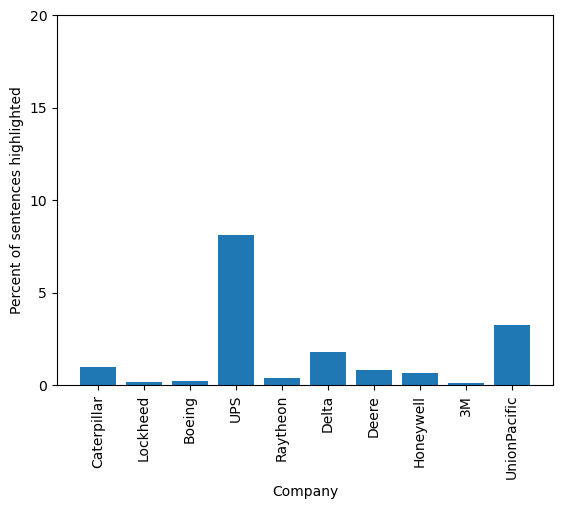

In [58]:
import matplotlib.pyplot as plt
import numpy as np
import glob
y = []

i = 0

for file in os.listdir(dir):
    y.append(100 * (rel_sent_list[i])/sentences_list[i])
    i = i+1

plt.bar(x_label, y, width = 0.8)
plt.xticks(rotation='vertical')
plt.xlabel("Company")
plt.ylabel("Percent of sentences highlighted")
plt.yticks(np.arange(0, 25, 5))
plt.show()

In [59]:
import pandas as pd

series = pd.Series(y)
series.describe()

count    10.000000
mean      1.646952
std       2.463286
min       0.102623
25%       0.255430
50%       0.733811
75%       1.589785
max       8.108108
dtype: float64

### Exporting and Saving Files 

In [60]:
#storing variable so they can be called between notebooks (for ML and aggregate work later on)

IND_reltext = rel_text_df
IND_alltext = all_text_df
IND_stat = final_text_stat

%store IND_reltext
%store IND_alltext
%store IND_stat

Stored 'IND_reltext' (DataFrame)
Stored 'IND_alltext' (DataFrame)
Stored 'IND_stat' (DataFrame)
